<a href="https://colab.research.google.com/github/niconielsen32/ObjectTracking/blob/main/ObjectTracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get the requirements

In [2]:
!pip install tf-centernet


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:

!pip install -r D:\Python\Projects\Ak\Akproj\requirements.txt

  Using cached scikit-image-0.17.2.tar.gz (29.8 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached lap-0.4.0.tar.gz (1.5 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 0.0/4.3 MB ? eta -:--:--
     -- ------------------------------------- 0.2/4.3 MB 7.6 MB/s eta 0:00:01
     ----- ---------------------------------- 0.6/4.3 MB 7.7 MB/s eta 0:00:01
     -------- ------------------------------- 0.9/4.3 MB 6.8 MB/s eta 0:00:01
     --------- ------------------------------ 1.0/4.3 MB 6.3 MB/s eta 0:00:01
     ---------- ----------------------------- 1.2/4.3 MB 5.6 MB/s eta 0:00:01
     ------------ --------------------------- 1.3/4.3 MB 5.5 MB/s eta 0:00:01
     ------------- -------------------------- 1.5/4.3 MB 5.2 MB/s eta 0:00:01
     --------------- ------------------------ 1.6/4.3 MB 5.2 MB/s eta 0:00:01
     ---

  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [525 lines of output]
      C:\Users\DELL\AppData\Local\Temp\pip-install-sz10w7wl\scikit-image_017b4886d1984222b388f361b05a6ccd\setup.py:159: DeprecationWarning:
      
        `numpy.distutils` is deprecated since NumPy 1.23.0, as a result
        of the deprecation of `distutils` itself. It will be removed for
        Python >= 3.12. For older Python versions it will remain present.
        It is recommended to use `setuptools < 60.0` for those Python versions.
        For more details, see:
          https://numpy.org/devdocs/reference/distutils_status_migration.html
      
      
        from numpy.distutils.core import setup
      C:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\setuptools\config\setupcfg.py:508: SetuptoolsDeprecationWarning: The license_file parameter is deprecated, use license_files instead.
        warnings.warn(msg, w

# Object Tracking with SORT

In [4]:
import sys
import os
#from google.colab import files
import centernet

#sys.path.append("/content/ObjectTracking")
from sort import Sort
from lib import VisTrack, show_video, create_video

import numpy as np
import PIL.Image
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import shutil

c:\Users\DELL\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Upload the video you want to work with

In [5]:

video_file = "D:\Python\Projects\Ak\Akproj\samplevideo.mp4"
show_video(video_file)

In [6]:
vt = VisTrack()

# Default: num_classes=80
obj = centernet.ObjectDetection(num_classes=80)

# num_classes=80 and weights_path=None: Pre-trained COCO model will be loaded.
obj.load_weights(weights_path=None)

## Example image

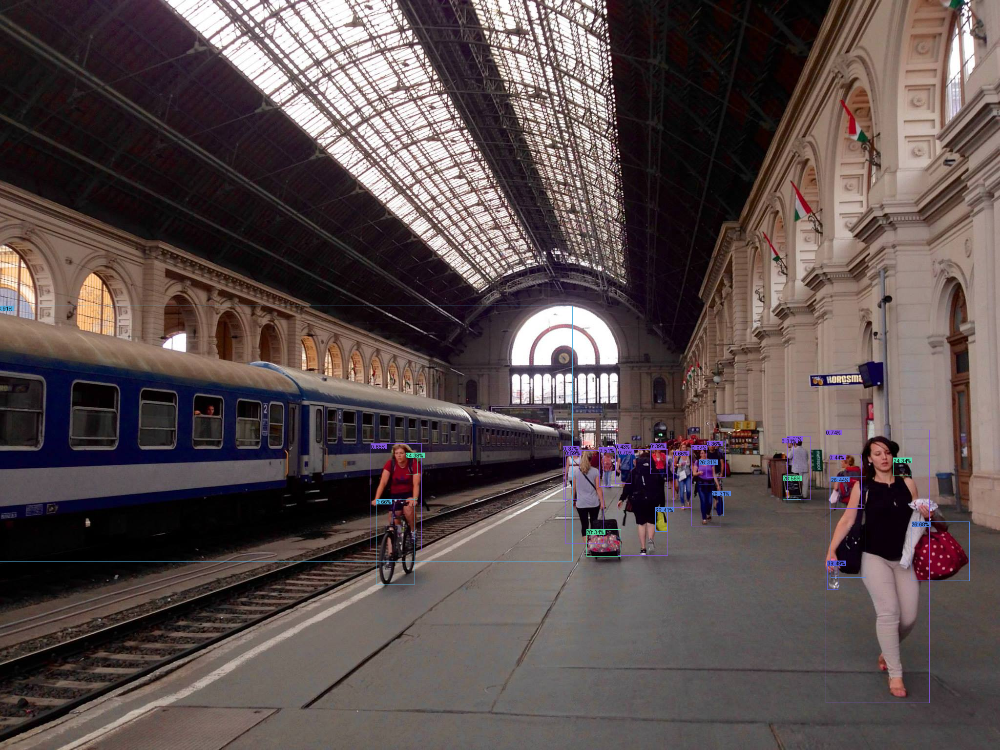

In [7]:

p_img = PIL.Image.open('D:\Python\Projects\Ak\ObjectTracking\image-asset.jpeg')
img = cv2.cvtColor(np.array(p_img), cv2.COLOR_BGR2RGB)

boxes, classes, scores = obj.predict(img)

vt.draw_bounding_boxes(p_img, boxes, classes, scores)

## Predict on the video

In [8]:
vidcap = cv2.VideoCapture(0)

# Create the SORT tracker
sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

# Create a window to display the output frame
cv2.namedWindow("Object Tracking", cv2.WINDOW_NORMAL)

folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

# Counter for frame numbering
i = 0

# Capture frames from the camera
while True:
    ret, frame = vidcap.read()
    if not ret:
        break

    boxes, classes, scores = obj.predict(frame)  # Assuming 'obj' is defined for object detection

    detections_in_frame = len(boxes)
    if detections_in_frame:
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 0)[0]
        boxes = boxes[idxs]
        scores = scores[idxs]
        classes = classes[idxs]
    else:
        boxes = np.empty((0, 5))

    dets = np.hstack((boxes, scores[:, np.newaxis]))
    res = sort.update(dets)

    boxes_track = res[:, :-1]
    boxes_ids = res[:, -1].astype(int)

    # Convert the frame to a PIL Image
    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    if detections_in_frame:
        # Assuming 'vt.draw_bounding_boxes' is defined for drawing bounding boxes
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boxes_ids, scores)

    # Save the frame as an image
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    # Convert the PIL Image back to a NumPy array for display
    frame_display = cv2.cvtColor(np.array(p_frame), cv2.COLOR_RGB2BGR)

    # Display the frame in the window
    cv2.imshow("Object Tracking", frame_display)

    i += 1

    # Check for the 'q' key to exit the loop and close the window
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture and close the window
vidcap.release()
cv2.destroyAllWindows()

: 

## Show and download the tracking

In [ ]:


track_video_file = 'tracking.mp4'
create_video(frames_pattern='Track/%03d.png', video_file=track_video_file, framerate=30)



In [ ]:

video_out_file = "D:\Python\Projects\Ak\ObjectTracking\tracking.mp4"
show_video(video_out_file)
